In [10]:
# Imports
import sys
import os
import json
import pandas as pd
import matplotlib.pyplot as plt 

In [11]:
# FEL
#path = "../FEL"
#files = [path+"/"+f.name for f in os.scandir(path) if f.name.endswith(".FEL.json")]
                                                                      
# FEL Internal
path="../FEL_internal"
files = [path+"/"+f.name for f in os.scandir(path) if f.name.endswith(".FEL_internal.json")]

files

['../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_127.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_112.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_129.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_14.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_21.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_5.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_60.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_55.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_CodonAligned.fas_subsampled_96.fasta_codon.alignment.FEL_internal.json',
 '../FEL_internal/TP53_refseq_cds_C

In [12]:
data_dict = {}
pvalue_threshold = 0.1

def return_positive_sites_count(MLE):
    global pvalue_threshold
    data_list = []
    count = 0
    for n, item in enumerate(MLE):
        if float(item[4] < pvalue_threshold): 
            #print(item)
            if float(item[0]) == 0.0:
                omega = 10000
            else:
                omega = float(item[1])/float(item[0])
            #end if
            
            if omega > 1.0:
                count += 1
                site = n + 1
                data_list.append(site)
            #end if
        #end if
    #end for
    return count, data_list
#end method

def return_negative_sites_count(MLE):
    global pvalue_threshold
    data_list = []
    count = 0
    for n, item in enumerate(MLE):
        if float(item[4] < pvalue_threshold): 
            #print(item)
            if float(item[0]) == 0.0:
                omega = 10000
            else:
                omega = float(item[1])/float(item[0])
            #end if
            
            if omega < 1.0:
                count += 1
                site = n + 1
                data_list.append(site)
            #end if
        #end if
    #end for
    return count, data_list
#end method


# Main -------------------------------------------------
count = 1

for filename in files:
    if os.stat(filename).st_size == 0: continue
    with open(filename, "r") as fh:
        json_data = json.load(fh)
    #end with
    num_seqs = json_data["input"]["number of sequences"]
    num_sites = json_data["input"]["number of sites"]
    print(filename.split("/")[-1], num_seqs, num_sites)
    
    positive_sites, positive_sites_list = return_positive_sites_count(json_data["MLE"]["content"]["0"])
    negative_sites, negative_sites_list = return_negative_sites_count(json_data["MLE"]["content"]["0"])
    
    
    # p-values
    p_values_list = []
    for item in json_data["MLE"]["content"]["0"]:
        p_value = item[4]
        p_values_list.append(p_value)
    #end for
    
    #data_dict[filename.split("/")[-1]] = {"num_seqs": num_seqs, "negative_sites": negative_sites, "positive_sites" : positive_sites}
    #data_dict[filename.split("/")[-1]] = {"num_seqs": num_seqs, "negative_sites": negative_sites, "positive_sites" : positive_sites}
    data_dict[count] = {"Filename":filename.split("/")[-1],
                        "num_seqs": num_seqs, 
                        "num_sites" :num_sites,
                        "negative_sites": negative_sites, 
                        "positive_sites" : positive_sites,
                        "positive_sites_list" : positive_sites_list,
                        "negative_sites_list" : negative_sites_list,
                        "p_values":p_values_list}
            
    count += 1
#end for

TP53_refseq_cds_CodonAligned.fas_subsampled_127.fasta_codon.alignment.FEL_internal.json 78 606
TP53_refseq_cds_CodonAligned.fas_subsampled_112.fasta_codon.alignment.FEL_internal.json 93 611
TP53_refseq_cds_CodonAligned.fas_subsampled_129.fasta_codon.alignment.FEL_internal.json 76 606
TP53_refseq_cds_CodonAligned.fas_subsampled_14.fasta_codon.alignment.FEL_internal.json 190 633
TP53_refseq_cds_CodonAligned.fas_subsampled_21.fasta_codon.alignment.FEL_internal.json 183 633
TP53_refseq_cds_CodonAligned.fas_subsampled_5.fasta_codon.alignment.FEL_internal.json 199 631
TP53_refseq_cds_CodonAligned.fas_subsampled_60.fasta_codon.alignment.FEL_internal.json 144 640
TP53_refseq_cds_CodonAligned.fas_subsampled_55.fasta_codon.alignment.FEL_internal.json 149 644
TP53_refseq_cds_CodonAligned.fas_subsampled_96.fasta_codon.alignment.FEL_internal.json 108 608
TP53_refseq_cds_CodonAligned.fas_subsampled_98.fasta_codon.alignment.FEL_internal.json 106 613
TP53_refseq_cds_CodonAligned.fas_subsampled_97.fast

TP53_refseq_cds_CodonAligned.fas_subsampled_108.fasta_codon.alignment.FEL_internal.json 96 606
TP53_refseq_cds_CodonAligned.fas_subsampled_132.fasta_codon.alignment.FEL_internal.json 73 595
TP53_refseq_cds_CodonAligned.fas_subsampled_107.fasta_codon.alignment.FEL_internal.json 97 602
TP53_refseq_cds_CodonAligned.fas_subsampled_83.fasta_codon.alignment.FEL_internal.json 121 612
TP53_refseq_cds_CodonAligned.fas_subsampled_75.fasta_codon.alignment.FEL_internal.json 129 638
TP53_refseq_cds_CodonAligned.fas_subsampled_40.fasta_codon.alignment.FEL_internal.json 164 627
TP53_refseq_cds_CodonAligned.fas_subsampled_34.fasta_codon.alignment.FEL_internal.json 170 624
TP53_refseq_cds_CodonAligned.fas_subsampled_42.fasta_codon.alignment.FEL_internal.json 162 627
TP53_refseq_cds_CodonAligned.fas_subsampled_77.fasta_codon.alignment.FEL_internal.json 127 628
TP53_refseq_cds_CodonAligned.fas_subsampled_79.fasta_codon.alignment.FEL_internal.json 125 624
TP53_refseq_cds_CodonAligned.fas_subsampled_36.fas

In [16]:
df = pd.DataFrame.from_dict(data_dict, orient='index')
#df.columns = ["Filename", "Num_Seqs", "Negative_Sites", "Positive_Sites"]
#df.rename(columns={'gdp':'log(gdp)'}, inplace=True)
#df.columns
df

,Filename,num_seqs,num_sites,negative_sites,positive_sites,positive_sites_list,negative_sites_list,p_values
1,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,78,606,279,3,"[39, 75, 176]","[1, 2, 3, 7, 12, 22, 23, 24, 25, 27, 28, 29, 3...","[0.03464484638334153, 9.521839711479352e-06, 4..."
2,TP53_refseq_cds_CodonAligned.fas_subsampled_11...,93,611,281,4,"[110, 132, 152, 184]","[6, 7, 11, 13, 14, 26, 27, 28, 29, 30, 31, 32,...","[1, 1, 1, 0.9905986859119077, 1, 0.00020947400..."
3,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,76,606,276,2,"[32, 40]","[1, 2, 3, 7, 14, 22, 23, 24, 25, 27, 28, 29, 3...","[0.002330532882226177, 0.0005716759148103323, ..."
4,TP53_refseq_cds_CodonAligned.fas_subsampled_14...,190,633,321,3,"[128, 262, 456]","[2, 3, 8, 9, 11, 12, 13, 20, 21, 22, 23, 24, 3...","[0.1941689281559391, 0.0005017416128257901, 3...."
5,TP53_refseq_cds_CodonAligned.fas_subsampled_21...,183,633,320,3,"[128, 262, 456]","[2, 3, 8, 9, 11, 12, 13, 20, 21, 22, 23, 24, 3...","[0.1947515590218672, 0.001217516847788369, 3.9..."
...,...,...,...,...,...,...,...,...
139,TP53_refseq_cds_CodonAligned.fas_subsampled_37...,167,629,326,5,"[101, 121, 256, 450, 613]","[3, 4, 9, 10, 12, 13, 14, 22, 23, 24, 25, 35, ...","[1, 0.1012654997046235, 5.384125092433578e-06,..."
140,TP53_refseq_cds_CodonAligned.fas_subsampled_39...,165,629,327,5,"[101, 121, 256, 450, 613]","[3, 4, 9, 10, 12, 13, 14, 22, 23, 24, 25, 35, ...","[1, 0.1019604798368048, 5.300325352064483e-06,..."
141,TP53_refseq_cds_CodonAligned.fas_subsampled_76...,128,634,300,4,"[87, 88, 95, 114]","[2, 3, 4, 8, 10, 11, 13, 23, 24, 26, 36, 37, 3...","[1, 0.01734361405197049, 5.440536389356154e-05..."
142,TP53_refseq_cds_CodonAligned.fas_subsampled_43...,161,637,326,5,"[97, 102, 122, 264, 458]","[3, 4, 8, 10, 11, 13, 15, 23, 24, 25, 26, 36, ...","[1, 0.9149410286064483, 5.704256378025185e-06,..."


In [17]:
df.sort_values(by=['num_seqs'], ascending=False)

,Filename,num_seqs,num_sites,negative_sites,positive_sites,positive_sites_list,negative_sites_list,p_values
71,TP53_refseq_cds_CodonAligned.fas_subsampled_0....,204,650,332,3,"[71, 222, 277]","[12, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 3...","[0.5411577310072795, 1, 1, 1, 1, 1, 1, 0.47446..."
74,TP53_refseq_cds_CodonAligned.fas_subsampled_1....,203,650,332,3,"[71, 222, 277]","[12, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 3...","[0.5409943240235738, 1, 1, 1, 1, 1, 1, 0.47455..."
56,TP53_refseq_cds_CodonAligned.fas_subsampled_2....,202,648,327,3,"[64, 115, 275]","[12, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 3...","[1, 1, 1, 1, 1, 1, 0.2453263245822507, 0.67894..."
47,TP53_refseq_cds_CodonAligned.fas_subsampled_3....,201,650,327,3,"[71, 222, 277]","[12, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 3...","[0.541613015551146, 1, 1, 1, 1, 1, 1, 0.464657..."
13,TP53_refseq_cds_CodonAligned.fas_subsampled_4....,200,631,326,2,"[107, 258]","[12, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 3...","[1, 1, 1, 1, 1, 1, 0.2494990299467345, 0.67220..."
...,...,...,...,...,...,...,...,...
106,TP53_refseq_cds_CodonAligned.fas_subsampled_13...,66,584,282,5,"[32, 49, 68, 526, 562]","[1, 2, 3, 7, 14, 22, 23, 24, 25, 27, 28, 29, 3...","[0.04639194785069356, 6.686866417027204e-06, 3..."
88,TP53_refseq_cds_CodonAligned.fas_subsampled_14...,65,591,280,2,"[32, 533]","[1, 2, 3, 7, 12, 22, 23, 24, 25, 27, 28, 29, 3...","[0.0443135983659062, 3.630770773921377e-06, 1...."
102,TP53_refseq_cds_CodonAligned.fas_subsampled_14...,64,590,280,2,"[32, 530]","[1, 2, 3, 7, 23, 24, 25, 27, 28, 29, 30, 31, 3...","[0.04601248581697204, 7.88714547266256e-05, 2...."
109,TP53_refseq_cds_CodonAligned.fas_subsampled_14...,63,581,281,2,"[32, 95]","[1, 2, 3, 7, 14, 23, 24, 25, 27, 28, 29, 30, 3...","[0.04287658550614615, 0.0001092845264333286, 1..."


In [18]:
def plot_df(df, y):
    plt.figure()
    df.sort_values(by=['num_seqs'], ascending=False).plot(kind="line", lw=4, y=y, color="skyblue", x="num_seqs", markerfacecolor='black', marker='o', markersize=6, rot=90, figsize=(12,12))
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    plt.xlabel('Number of Sequences',  fontsize=24)
    plt.ylabel('Number of Sites', fontsize=24)
    plt.show()
#end method


<Figure size 432x288 with 0 Axes>

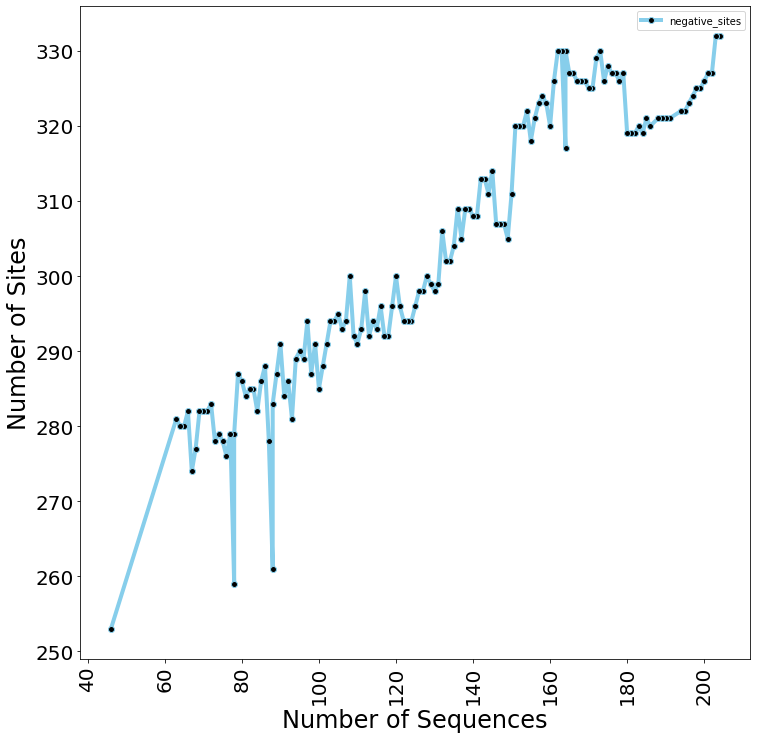

In [19]:
plot_df(df, "negative_sites")

<Figure size 432x288 with 0 Axes>

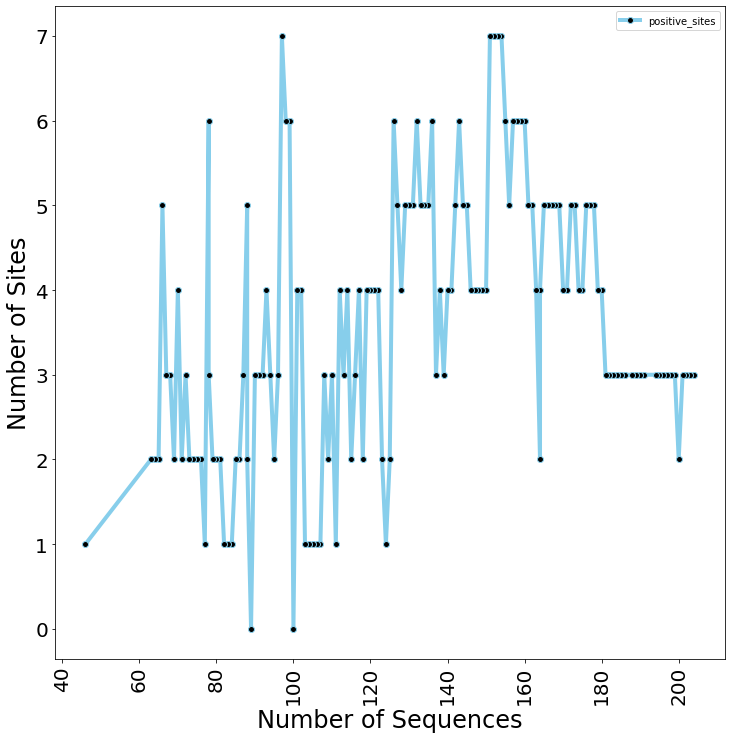

In [20]:
plot_df(df, "positive_sites")

## Ignore Below


<AxesSubplot:xlabel='num_seqs'>

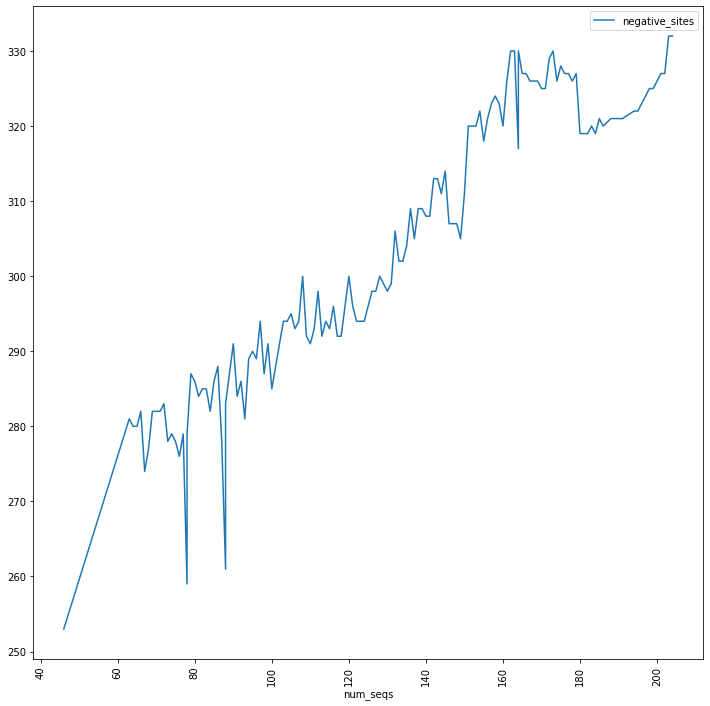

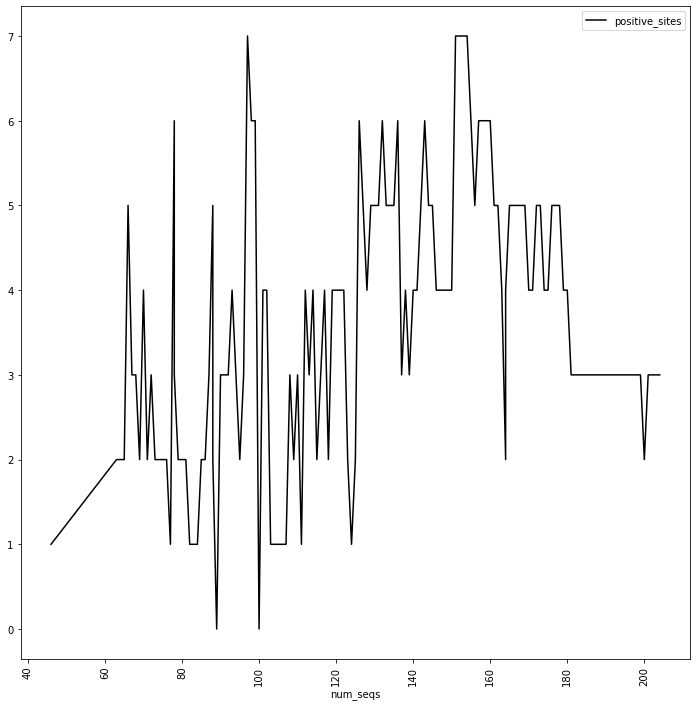

In [11]:
#df.sort_values(by=['col1'])
import matplotlib as plt

#plt.xticks(rotation=90)
df.sort_values(by=['num_seqs'], ascending=False).plot(kind="line", y="negative_sites", x="num_seqs", rot=90, figsize=(12,12))



# FEL Positive
#df.plot(kind='bar',alpha=0.75, rot=0)
#df.plot(figsize=(3,3));
df.sort_values(by=['num_seqs'], ascending=False).plot(kind="line", colormap="cubehelix", y="positive_sites", x="num_seqs", rot=90, figsize=(12,12))






# Numsites versus num_seqs
#df.sort_values(by=['num_seqs'], ascending=False).plot(kind="line", colormap="jet", y="num_sites", x="num_seqs", rot=90, figsize=(12,12))


In [ ]:
####

### IGNORE BELOW 

####

In [8]:
# p-values plot
max_num_sites = max(df["num_sites"])

#Filename = color
#x = Site, actually max number of sites
#y = p-value at that site.

new_dict = {}
#for item in range(1, max_num_sites):
#    new_dict[item] = {"Site": item}
#new_dict

count = 1
for index, row in df.iterrows():
    #print(row['Filename'], row['p_values'])
    #new_dict[item] += {"Filename": row['Filename']}
    #new_dict[count] = {"Filename": row['Filename']}
    for n, item in enumerate(row['p_values']):
        
        new_dict[count] = {"Filename": row['Filename'], "Site": n+1,"p-value": item}
        count += 1
#end for


df_pvalue = pd.DataFrame.from_dict(new_dict, orient='index')
df_pvalue


#key is a running number
# filename, site number, pvalue is on the row

,Filename,Site,p-value
1,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,1,0.034645
2,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,2,0.000010
3,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,3,0.000005
4,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,4,0.303413
5,TP53_refseq_cds_CodonAligned.fas_subsampled_12...,5,0.237521
...,...,...,...
88454,TP53_refseq_cds_CodonAligned.fas_subsampled_78...,624,0.000009
88455,TP53_refseq_cds_CodonAligned.fas_subsampled_78...,625,0.000869
88456,TP53_refseq_cds_CodonAligned.fas_subsampled_78...,626,0.000028
88457,TP53_refseq_cds_CodonAligned.fas_subsampled_78...,627,0.000005


In [10]:
# Plot - p_values
import plotly.express as px
import plotly.io as pio
#pio.templates

fig = px.scatter(df_pvalue, x="Site", y="p-value", color="p-value", template="simple_white")
fig.show()

In [11]:
positive_sites_list = []
negative_sites_list = []
sites = len(data_dict.keys())

for item in data_dict:
    for site in data_dict[item]["positive_sites_list"]:
        positive_sites_list.append(site)
    #end for
#end for

for item in data_dict:
    for site in data_dict[item]["negative_sites_list"]:
        negative_sites_list.append(site)
    #end for
#end for

print(sites, "Done")
print(positive_sites_list)

143 Done
[39, 75, 176, 110, 132, 152, 184, 32, 40, 128, 262, 456, 128, 262, 456, 256, 454, 615, 107, 131, 149, 263, 461, 158, 268, 466, 628, 77, 108, 244, 252, 108, 103, 107, 258, 158, 268, 466, 628, 107, 131, 149, 264, 462, 625, 128, 262, 456, 128, 262, 456, 77, 102, 151, 32, 99, 39, 85, 179, 76, 113, 178, 101, 122, 140, 254, 128, 262, 456, 158, 268, 466, 628, 158, 268, 466, 628, 257, 455, 616, 76, 93, 173, 257, 401, 472, 128, 262, 456, 128, 262, 456, 112, 592, 112, 242, 596, 128, 262, 456, 128, 262, 456, 128, 262, 456, 158, 268, 466, 628, 128, 262, 456, 107, 128, 146, 261, 459, 256, 454, 615, 107, 131, 149, 263, 461, 80, 183, 39, 67, 86, 87, 157, 39, 97, 105, 440, 604, 95, 107, 124, 144, 258, 618, 71, 222, 277, 101, 103, 108, 132, 151, 265, 463, 104, 147, 260, 620, 124, 258, 452, 614, 123, 201, 257, 451, 613, 86, 247, 123, 201, 257, 451, 613, 128, 262, 456, 123, 201, 257, 451, 613, 64, 115, 275, 101, 108, 145, 259, 618, 142, 256, 616, 101, 103, 108, 132, 151, 265, 463, 109, 436, 602,

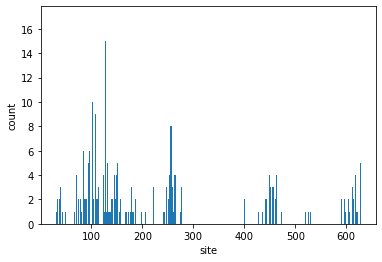

In [12]:
import numpy as np
import random
from matplotlib import pyplot as plt

#data = positive_sites_li
# fixed bin size
#bins = np.arange(-100, 100, 5) # fixed bin size
#plt.xlim([min(data)-5, max(data)+5])

plt.hist(positive_sites_list, bins=max(df["num_sites"]), alpha=1)
#plt.title('Random Gaussian data (fixed bin size)')
plt.xlabel('site')
plt.ylabel('count')

plt.show()

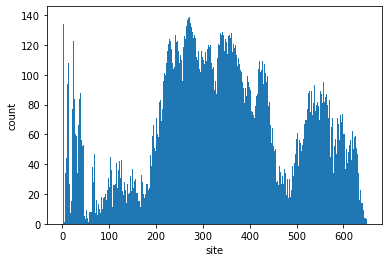

In [13]:
import numpy as np
import random
from matplotlib import pyplot as plt

# fixed bin size
#bins = np.arange(-100, 100, 5) # fixed bin size
#plt.xlim([min(data)-5, max(data)+5])

plt.hist(negative_sites_list, bins=max(df["num_sites"]), alpha=1)
#plt.title('Random Gaussian data (fixed bin size)')
plt.xlabel('site')
plt.ylabel('count')

plt.show()